# Colour - Checker Detection - Examples: Segmentation

This notebook showcases segmentation retated colour checker detection examples.

<div class="alert alert-info">
The original *.CR2 files were processed with <em>dcraw</em> as follows: <code>dcraw -T -g 2.4 12.92 *.CR2</code> and then resized and converted to *.png with <em>Image Magick</em> as follows: <code>mogrify -resize 50% -format png *.tiff</code>.
</div>

In [1]:
import glob
import os

import colour

from colour_checker_detection import (
    ROOT_RESOURCES_EXAMPLES,
    detect_colour_checkers_segmentation,
)

colour.plotting.colour_style()

colour.utilities.describe_environment();

*                                                                             *
*   Interpreter :                                                             *
*       python : 3.13.0 (main, Oct  7 2024, 23:47:22) [Clang 18.1.8 ]         *
*                                                                             *
*   colour-science.org :                                                      *
*       colour : v0.2.1-29-gb1448e7                                           *
*       colour-checker-detection : v0.2.1-29-gb1448e7                         *
*                                                                             *
*   Runtime :                                                                 *
*       imageio : 2.37.0                                                      *
*       matplotlib : 3.10.6                                                   *
*       networkx : 3.5                                                        *
*       numpy : 2.3.3                   

## Images

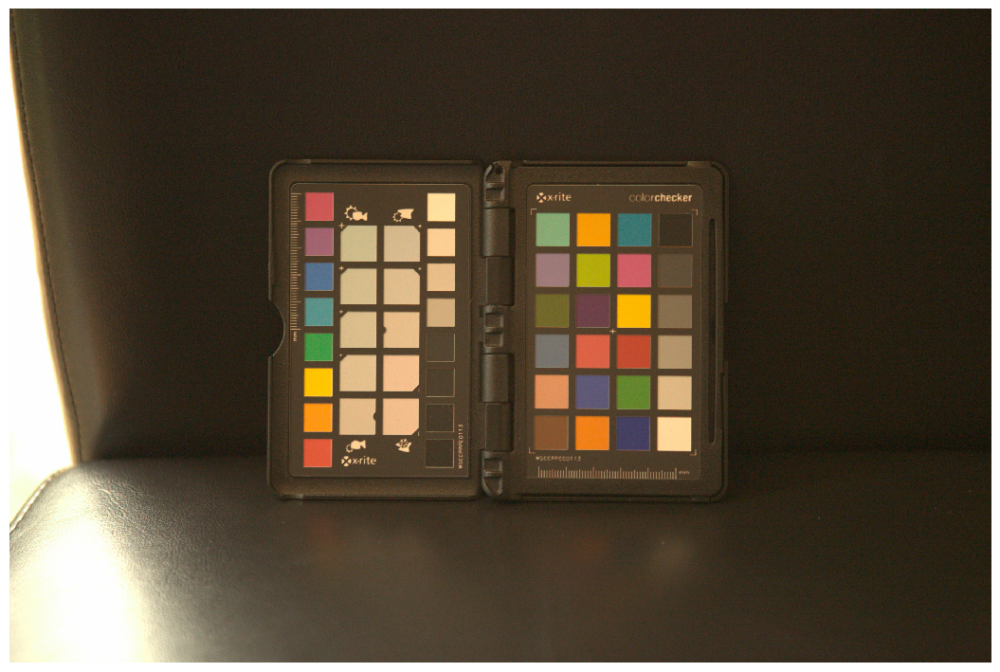

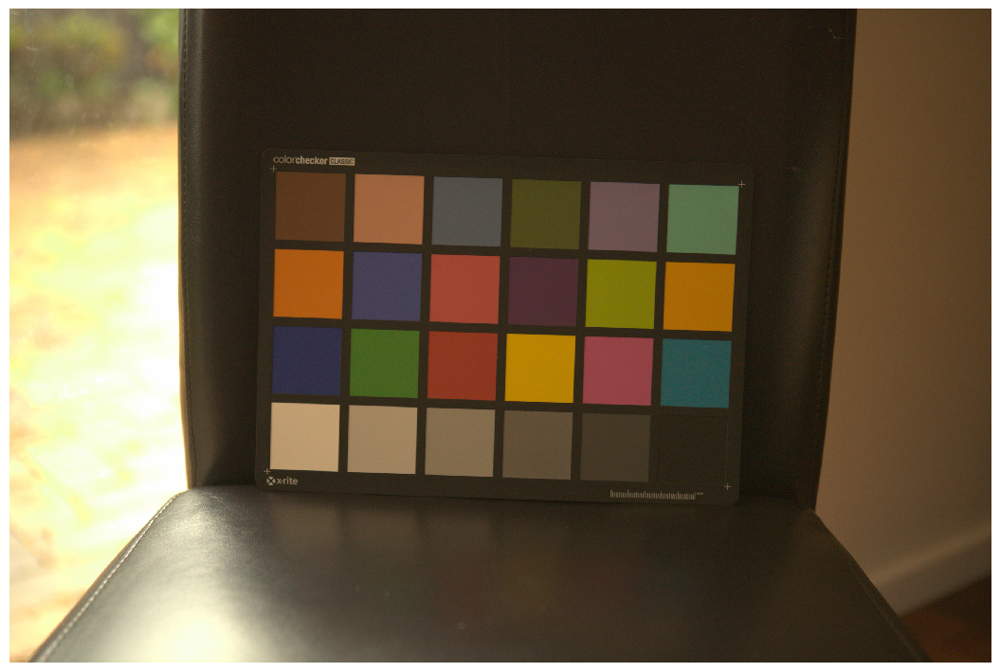

In [2]:
COLOUR_CHECKER_IMAGE_PATHS = glob.glob(
    os.path.join(ROOT_RESOURCES_EXAMPLES, "detection", "*19*.png")
)

COLOUR_CHECKER_IMAGES = [
    colour.cctf_decoding(colour.io.read_image(path))
    for path in COLOUR_CHECKER_IMAGE_PATHS
]

for image in COLOUR_CHECKER_IMAGES:
    colour.plotting.plot_image(colour.cctf_encoding(image))

## Detection

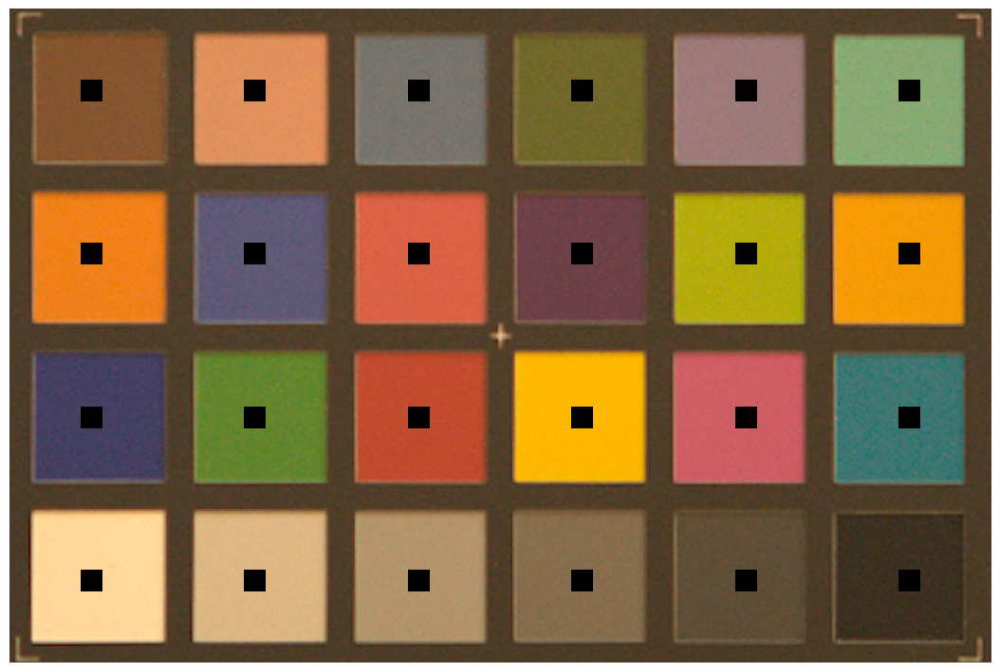

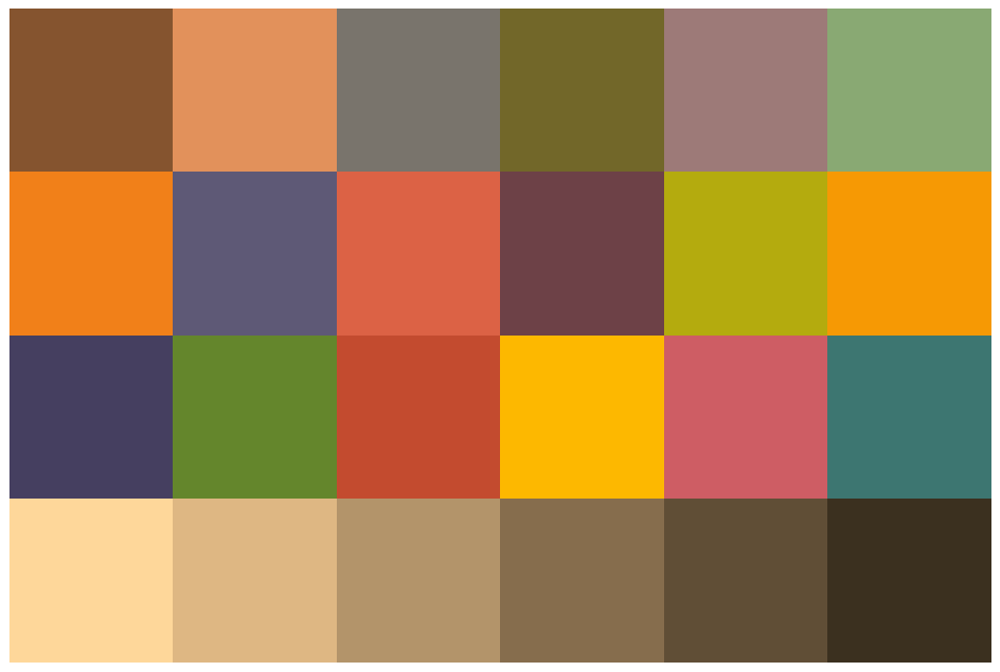

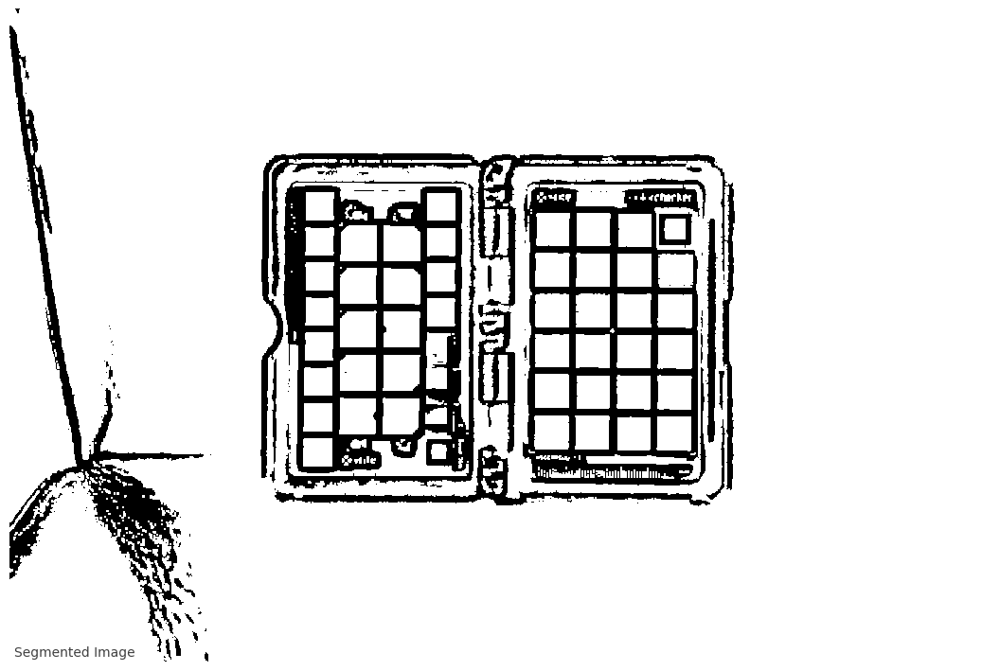

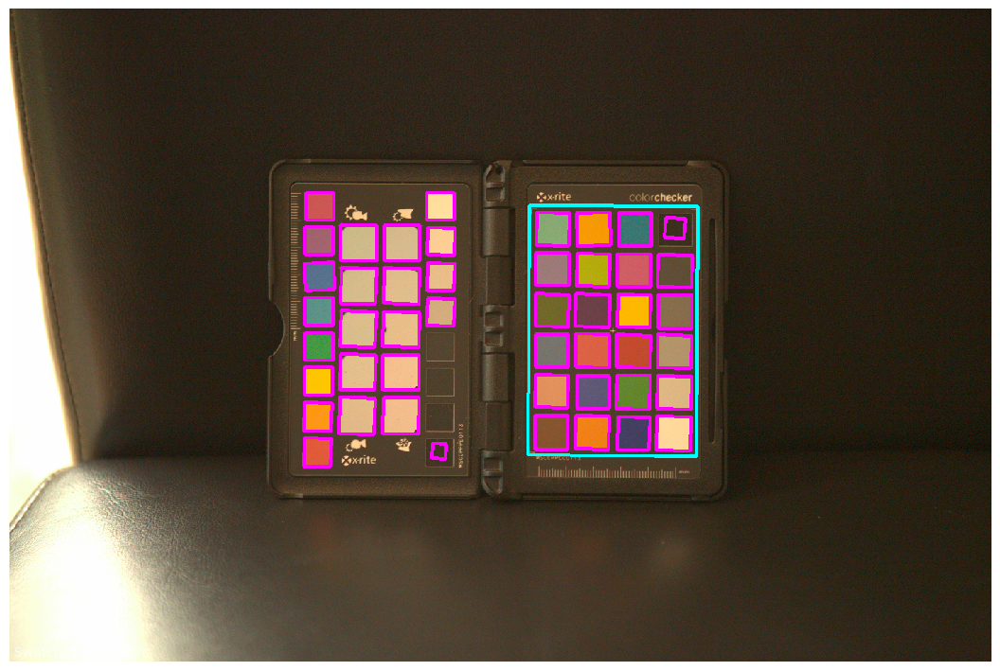

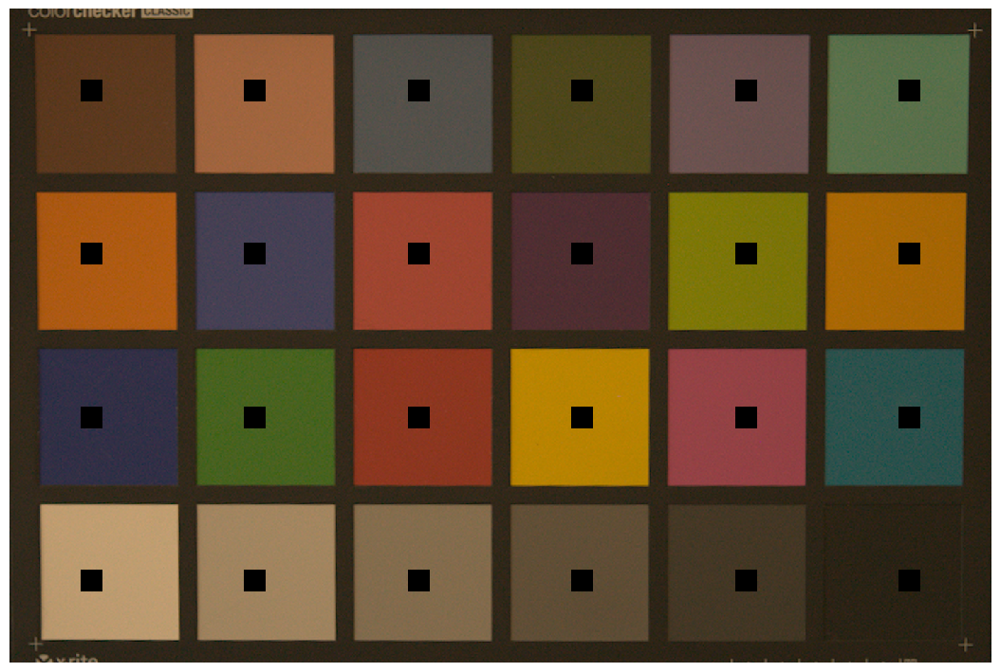

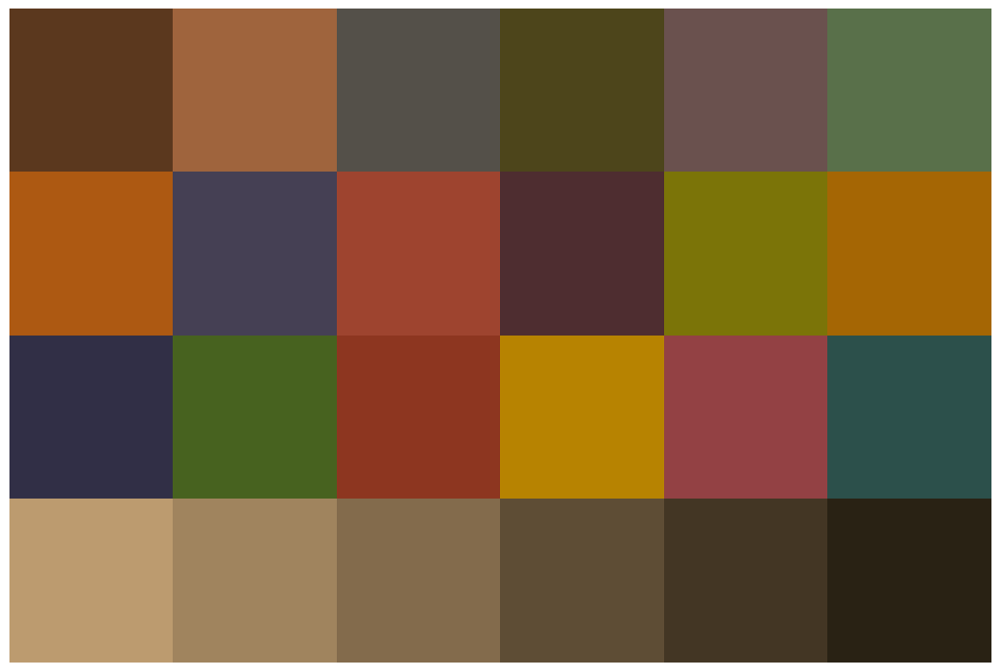

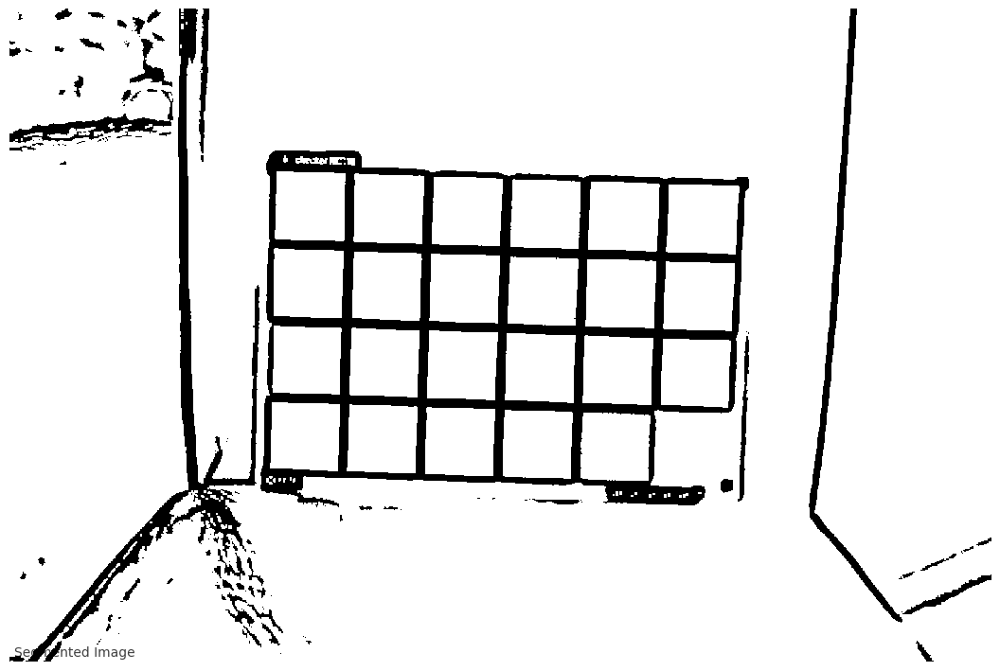

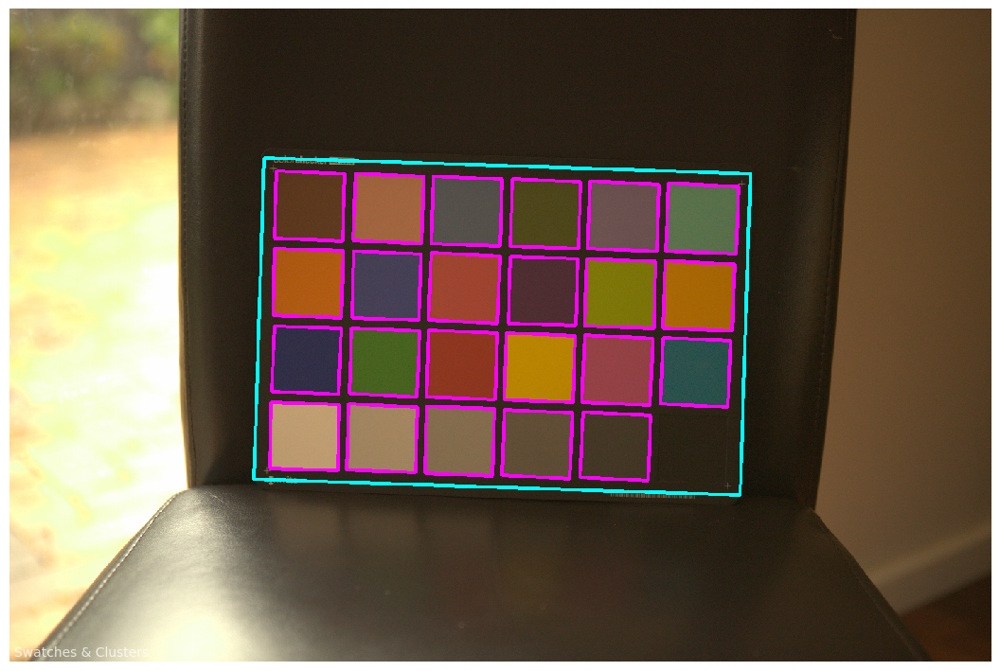

In [3]:
SWATCHES = []
for image in COLOUR_CHECKER_IMAGES:
    SWATCHES.extend(detect_colour_checkers_segmentation(image, show=True))

## Colour Fitting

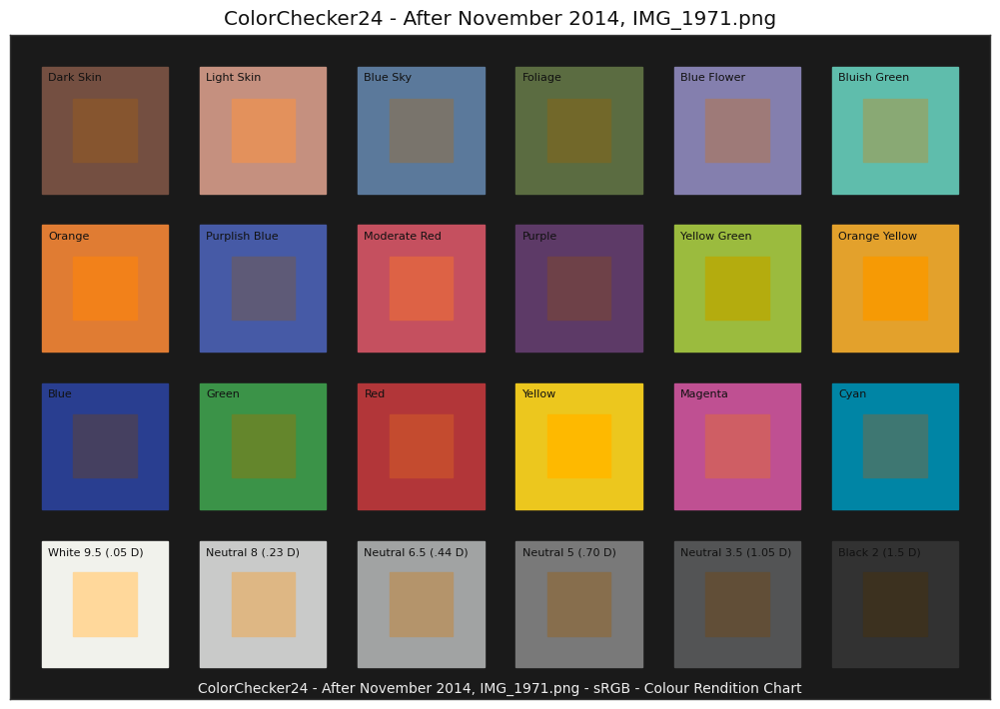

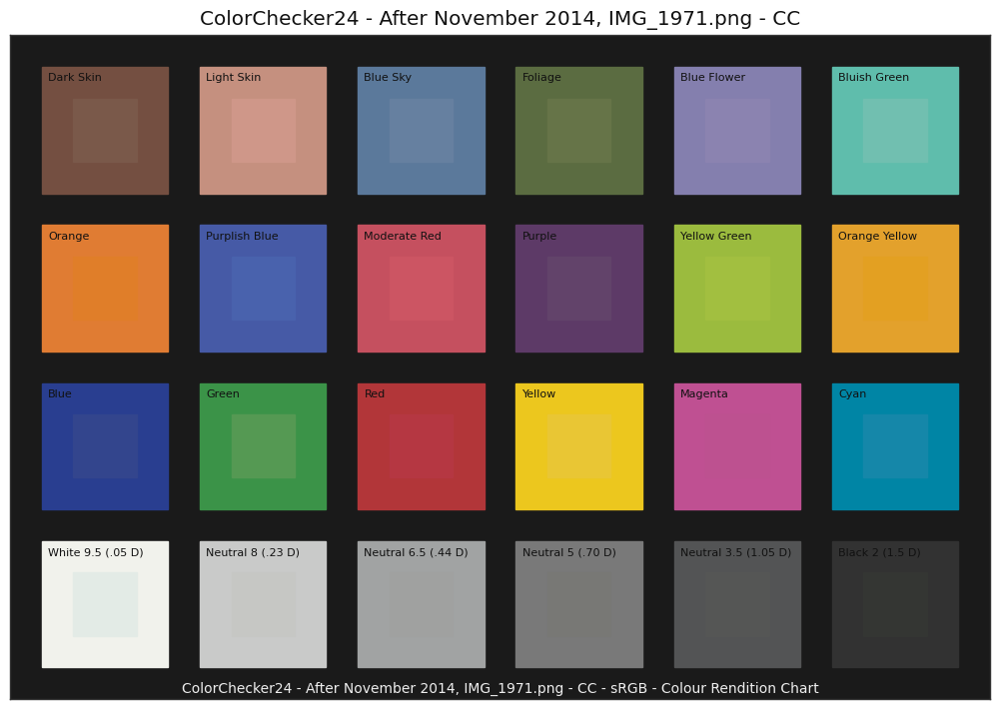

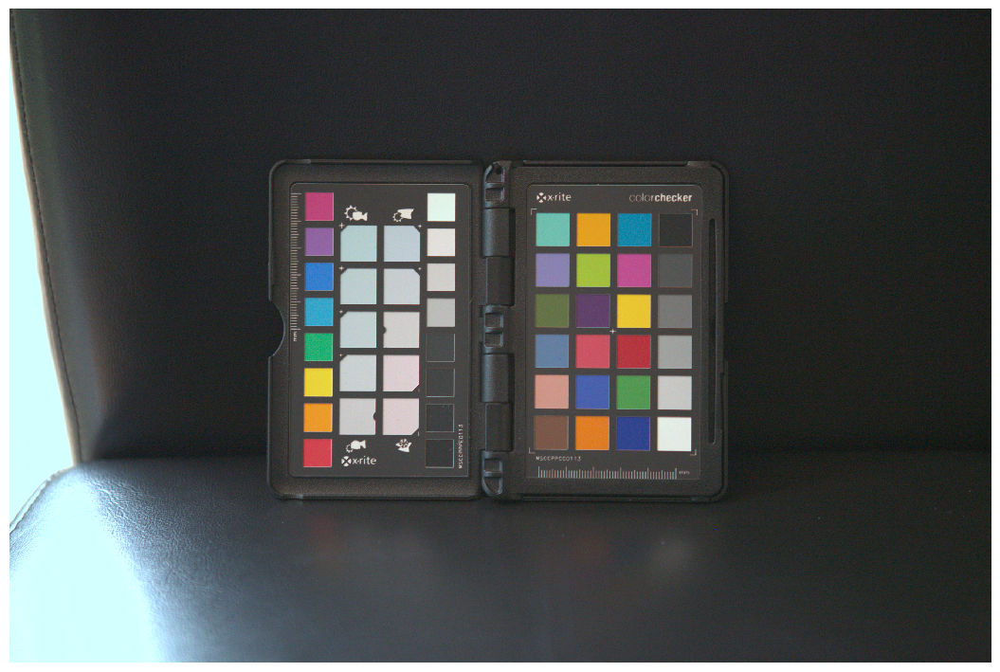

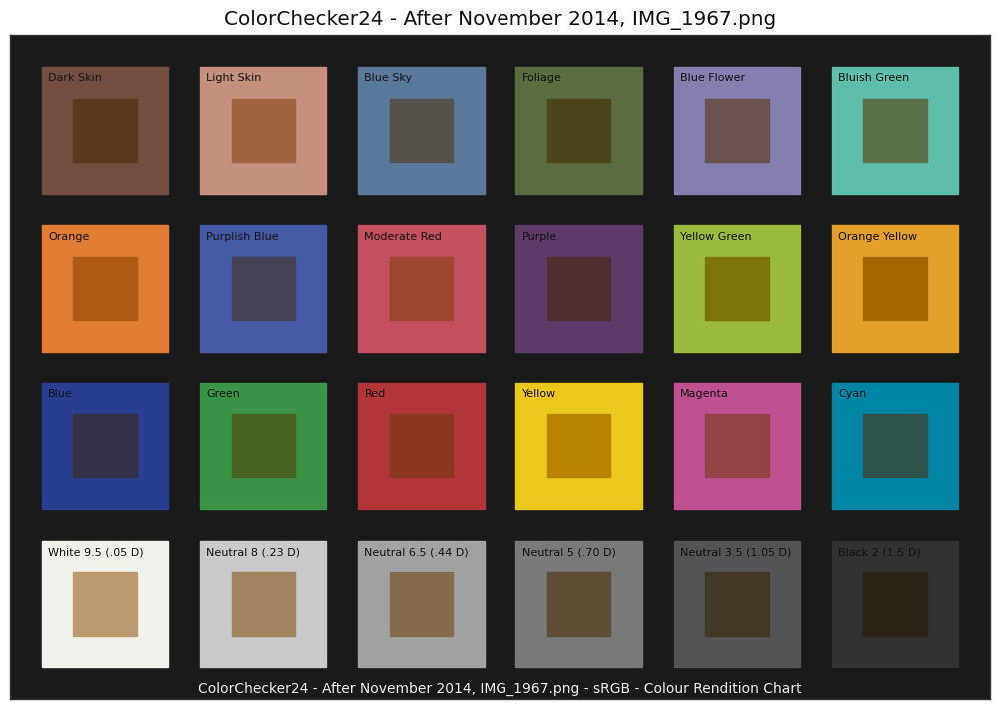

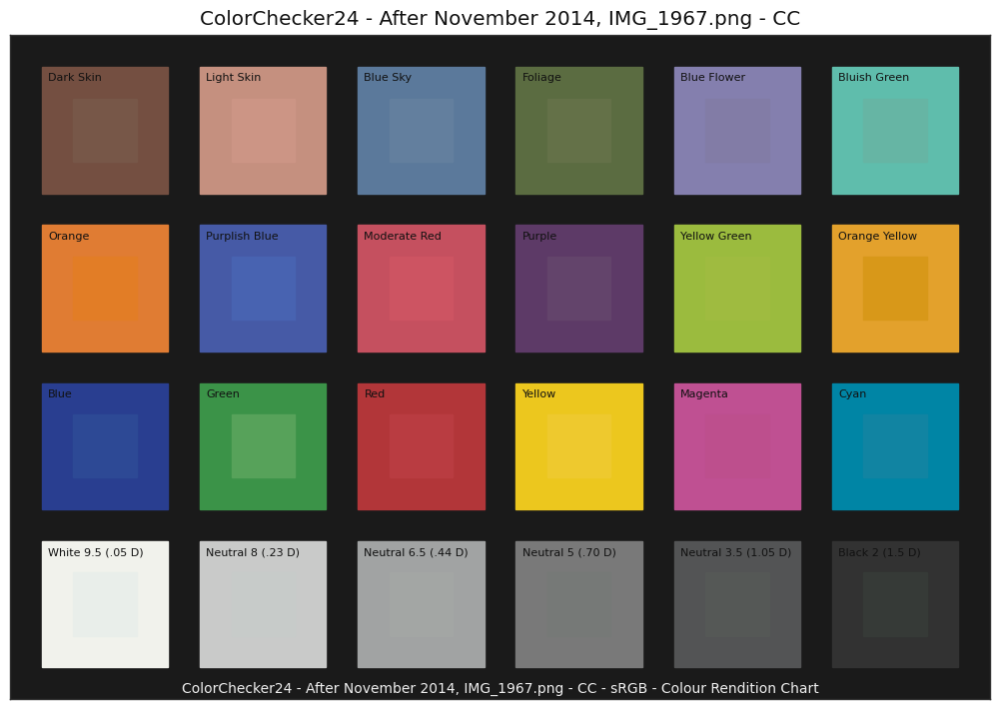

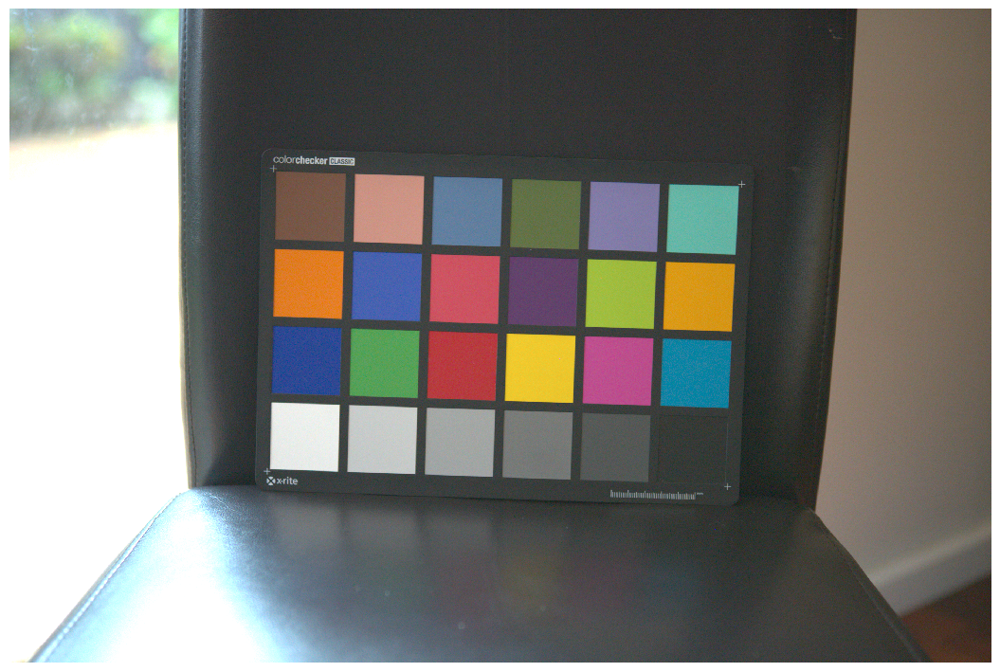

In [4]:
D65 = colour.CCS_ILLUMINANTS["CIE 1931 2 Degree Standard Observer"]["D65"]
REFERENCE_COLOUR_CHECKER = colour.CCS_COLOURCHECKERS[
    "ColorChecker24 - After November 2014"
]

colour_checker_rows = REFERENCE_COLOUR_CHECKER.rows
colour_checker_columns = REFERENCE_COLOUR_CHECKER.columns

# NOTE: The reference swatches values as produced by the "colour.XYZ_to_RGB"
# definition are linear by default.
# See https://github.com/colour-science/colour-checker-detection/discussions/59
# for more information.
REFERENCE_SWATCHES = colour.XYZ_to_RGB(
    colour.xyY_to_XYZ(list(REFERENCE_COLOUR_CHECKER.data.values())),
    "sRGB",
    REFERENCE_COLOUR_CHECKER.illuminant,
)

for i, swatches in enumerate(SWATCHES):
    swatches_xyY = colour.XYZ_to_xyY(colour.RGB_to_XYZ(swatches, "sRGB", D65))

    colour_checker = colour.characterisation.ColourChecker(
        os.path.basename(COLOUR_CHECKER_IMAGE_PATHS[i]),
        dict(zip(REFERENCE_COLOUR_CHECKER.data.keys(), swatches_xyY, strict=False)),
        D65,
        colour_checker_rows,
        colour_checker_columns,
    )

    colour.plotting.plot_multi_colour_checkers(
        [REFERENCE_COLOUR_CHECKER, colour_checker]
    )

    swatches_f = colour.colour_correction(swatches, swatches, REFERENCE_SWATCHES)
    swatches_f_xyY = colour.XYZ_to_xyY(colour.RGB_to_XYZ(swatches_f, "sRGB", D65))
    colour_checker = colour.characterisation.ColourChecker(
        f"{os.path.basename(COLOUR_CHECKER_IMAGE_PATHS[i])} - CC",
        dict(zip(REFERENCE_COLOUR_CHECKER.data.keys(), swatches_f_xyY, strict=False)),
        D65,
        colour_checker_rows,
        colour_checker_columns,
    )

    colour.plotting.plot_multi_colour_checkers(
        [REFERENCE_COLOUR_CHECKER, colour_checker]
    )

    colour.plotting.plot_image(
        colour.cctf_encoding(
            colour.colour_correction(
                COLOUR_CHECKER_IMAGES[i], swatches, REFERENCE_SWATCHES
            )
        )
    )

# Failures

The current segmentation process is prone to fail if the image is not normal to the optical path, in such cases, it is recommended to use the machine learning inference approach:

<div class="alert alert-info">
The image path can also be passed directly to the detection definition and that it is possible to control the image decoding directly.
</div>

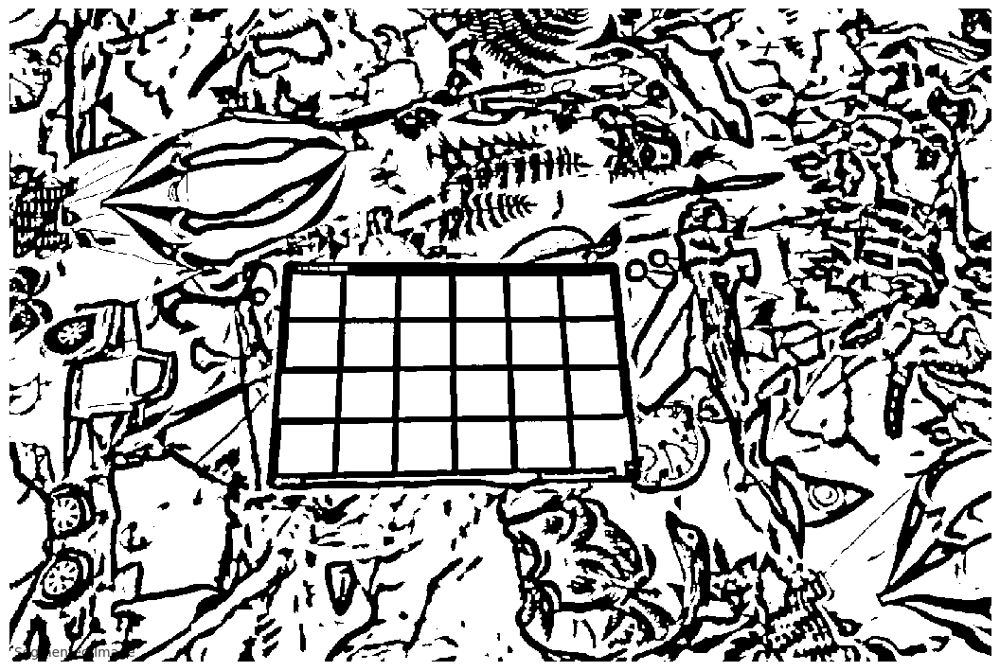

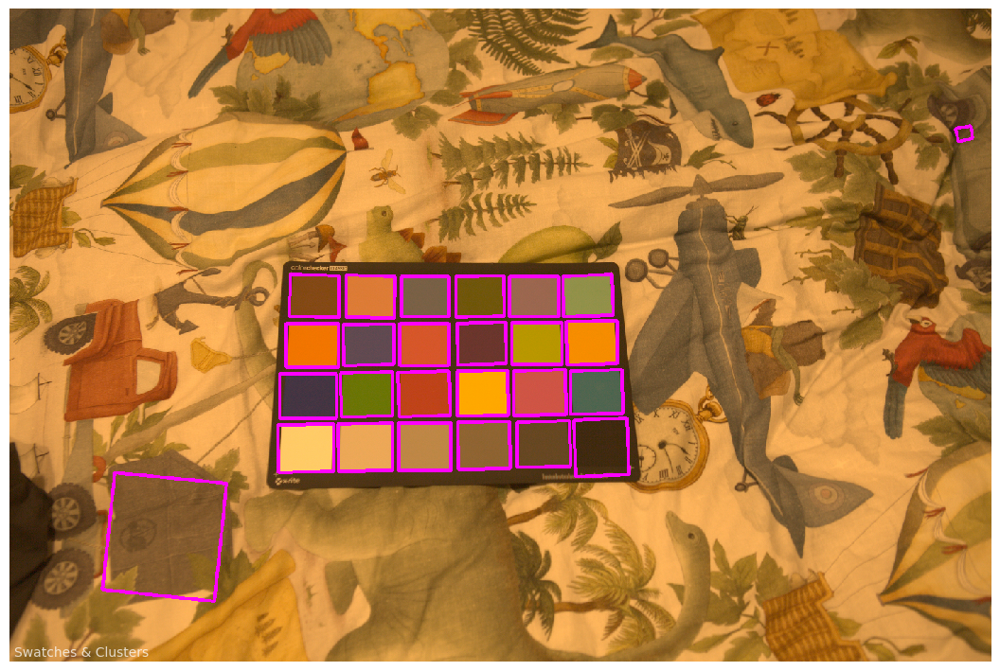

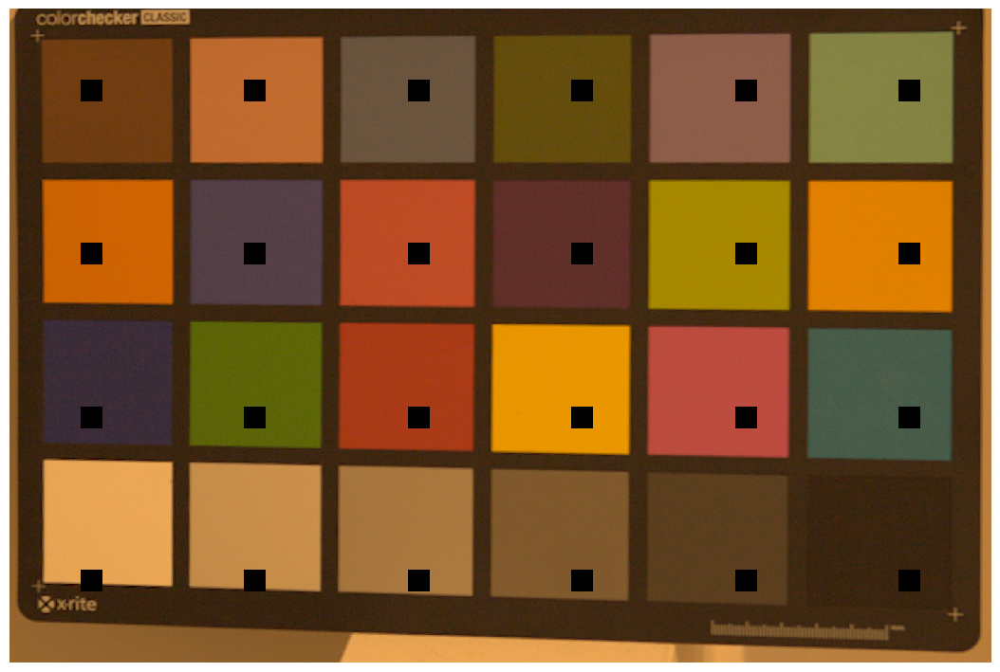

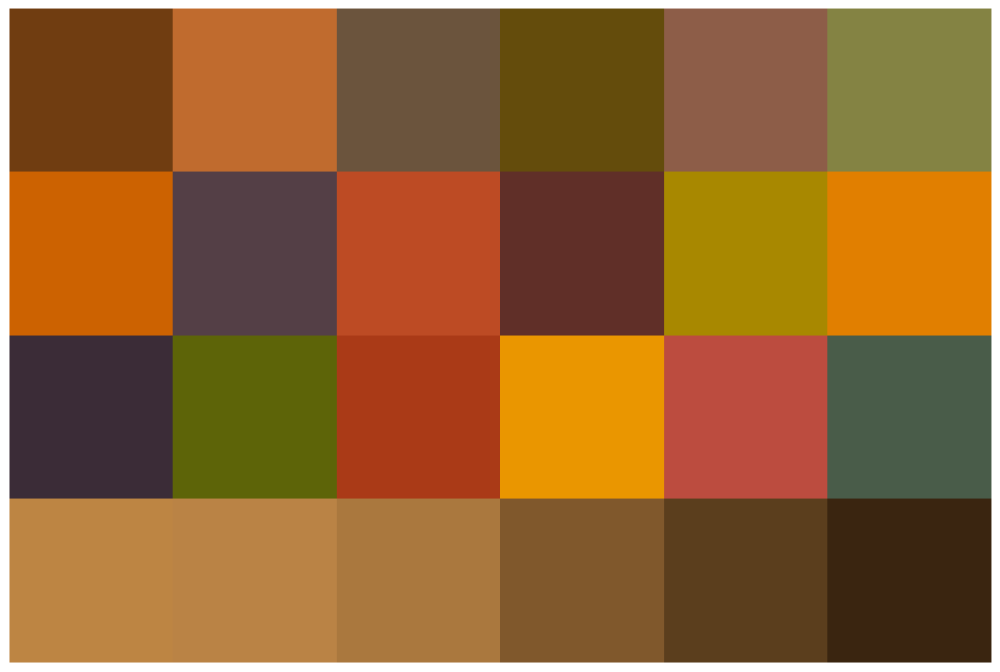

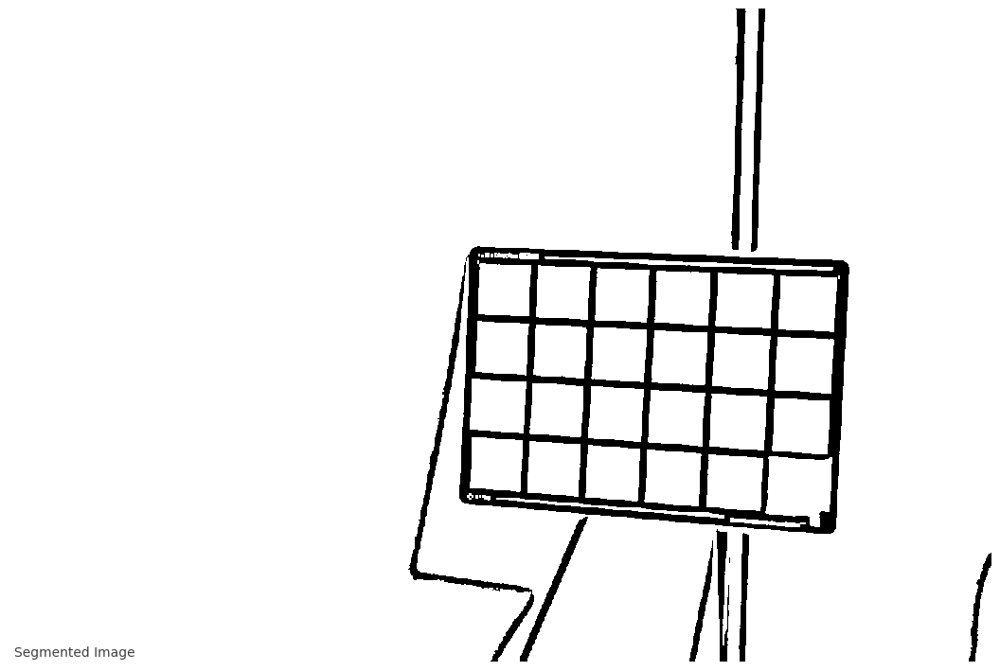

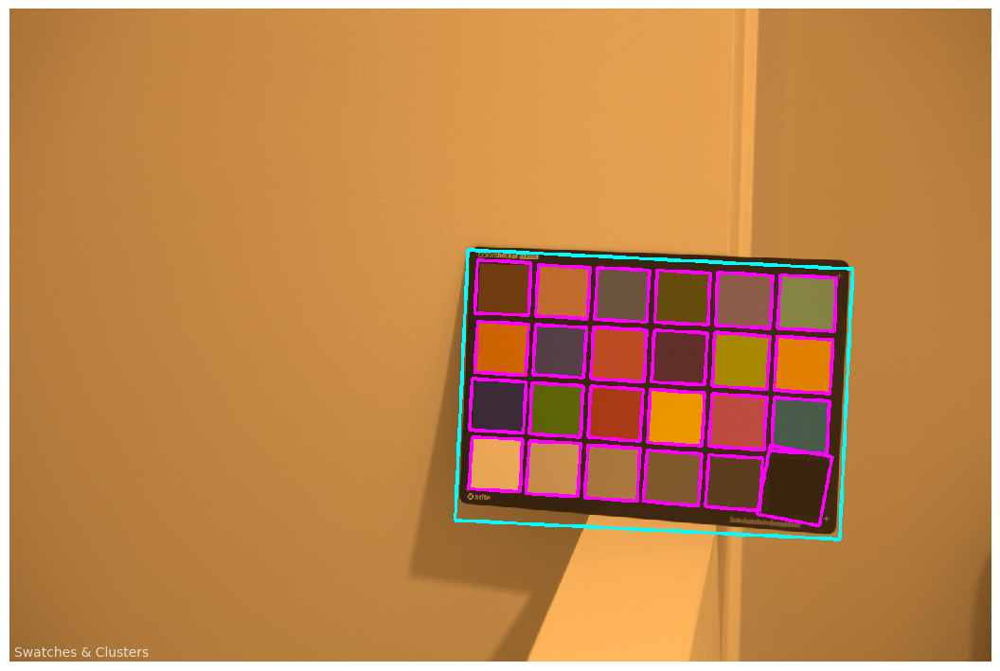

In [5]:
COLOUR_CHECKER_IMAGE_PATHS = glob.glob(
    os.path.join(ROOT_RESOURCES_EXAMPLES, "detection", "*25*.png")
)

for path in COLOUR_CHECKER_IMAGE_PATHS:
    for _colour_checker_data in detect_colour_checkers_segmentation(
        path, apply_cctf_decoding=True, show=True
    ):
        ...